In [2]:
import scanpy as sc
import tcri
import pandas as pd
from genevector.data import GeneVectorDataset
from genevector.model import GeneVector
from genevector.embedding import GeneEmbedding, CellEmbedding
import grimoire as spell
import os
import matplotlib.pyplot as plt
import shutil

In [3]:
adata = sc.read("/Users/ceglian/Data/tcri/zhang/zhang_pp.h5ad")

ct = []
for x,y in zip(adata.obs["timepoint"],adata.obs["patient"]):
    if y == "P13" and x == "post.2":
        ct.append("post.3")
    else:
        ct.append(x)
adata.obs["timepoint"] = ct

ct = []
for x in adata.obs["timepoint"]:
    if "pre" in x:
        ct.append("Pre-treatment")
    else:
        ct.append("Post-treatment")
adata.obs["timepoint_simple"] = ct

ct = []
for x in adata.obs["response"]:
    if "None" in x:
        ct.append("Treatment-Naive")
    else:
        ct.append("On-treatment")
adata.obs["treatment"] = ct

ct = []
for x,y in zip(adata.obs["response"], adata.obs['timepoint']):
    ct.append("{}_{}".format(x,y))
adata.obs["timepoint_complex"] = ct


ct = []
for x,y,z in zip(adata.obs["response"], adata.obs['timepoint'], adata.obs["patient"]):
    ct.append("{}_{}_{}".format(x,y,z))
adata.obs["patient_timepoint_complex"] = ct

ct = []
for x in adata.obs["patient"]:
    if x in ["P13","P01", "P36","P37","P38"]:
        ct.append("NR")
    else:
        ct.append("CR")
adata.obs["complete_response"] = ct

ct = []
ctx = []
for x,y,z,w in zip(adata.obs["patient"],adata.obs["response"],  adata.obs["timepoint_complex"], adata.obs["complete_response"]):
    if x =="P13" and y == "None":
        ct.append("No")
        ctx.append("No_post.3")
    else:
        ct.append(y)
        ctx.append(z)

adata.obs["response"] = ct
adata.obs["timepoint_complex"] = ctx

ct = []
for x,y,z in zip(adata.obs["patient"],adata.obs["timepoint_complex"], adata.obs["complete_response"]):
    if x =="P13" and y == "Yes_post.1":
        ct.append("Pre_Relapse")
    elif x =="P1" and y == "Yes_post.2":
        ct.append("Pre_Relapse")
    else:
        ct.append(y)
adata.obs["timepoint_relapse"] = ct

ct = []
for x,y,z in zip(adata.obs["response"], adata.obs['timepoint'], adata.obs["patient"]):
    ct.append("{}_{}_{}".format(x,y,z))
adata.obs["patient_timepoint_complex"] = ct

In [ ]:
genes = adata.var.index.tolist()
genes = [x for x in genes if "-" not in x or "HLA" in x]
genes = [x for x in genes if "." not in x or "HLA" in x]
adata = adata[:,genes]
adata.var_names_make_unique

In [22]:
# #any without signed mi were  false
# signed_mi          = True
# init_ortho         = True
# entropy_threshold  = 1.5
# mutual_information = "/Users/ceglian/Data/tcri/zhang_cd8_{}_{}.p".format(signed_mi,str(entropy_threshold).replace(".",""))
# print(mutual_information)
# embedding_size     = 100
# alpha              = 0.08
# beta               = 0.02
# gain               = 10
# vector_file        = "/Users/ceglian/Data/tcri/zhang_cd8_{}_{}_{}_{}_{}_{}.vec".format(embedding_size, alpha, beta, gain, signed_mi, init_ortho)
# print(vector_file)
# retrain            = True
# annotated_h5ad     = "/Users/ceglian/Data/tcri/zhang_annotated.h5ad"
# device             = "cpu"
# figure_path = "/Users/ceglian/Data/tcri/zhang/figures/"

/Users/ceglian/Data/tcri/zhang_cd8_True_15.p
/Users/ceglian/Data/tcri/zhang_cd8_100_0.08_0.02_10_True_True.vec


In [4]:
#any without signed mi were  false
signed_mi          = True
init_ortho         = True

entropy_threshold  = 1.5

mutual_information = "/Users/ceglian/Data/tcri/zhang_cd8_{}_{}.p".format(signed_mi,str(entropy_threshold).replace(".",""))

embedding_size     = 100
alpha              = 0.08
beta               = 0.02
gain               = 10

vector_file        = "/Users/ceglian/Data/tcri/zhang_cd8_v2_{}_{}_{}_{}_{}_{}.vec".format(embedding_size, alpha, beta, gain, signed_mi, init_ortho)

retrain            = False
annotated_h5ad     = "/Users/ceglian/Data/tcri/zhang_annotated_v2.h5ad"
device             = "cpu"

figure_path = "/Users/ceglian/Data/tcri/zhang/figures/"

In [5]:
genes = [x for x in adata.var.index.tolist()]
genes = [x for x in genes if "TRAV" not in x]
genes = [x for x in genes if "TRAJ" not in x]
genes = [x for x in genes if "TRAD" not in x]

genes = [x for x in genes if "TRBV" not in x]
genes = [x for x in genes if "TRBJ" not in x]
genes = [x for x in genes if "TRBD" not in x]

genes = [x for x in genes if "TRGV" not in x]
genes = [x for x in genes if "TRGJ" not in x]
genes = [x for x in genes if "TRGD" not in x]

genes = [x for x in genes if "TRDV" not in x]
genes = [x for x in genes if "TRDJ" not in x]
genes = [x for x in genes if "TRDD" not in x]

adata = adata[adata.obs["trb"]!=""]
adata = adata[adata.obs["trb"]!="nan"]
adata = adata[adata.obs["trb"]!="Other"]

adata = adata[:,genes]

adata = spell.pp.remove_meaningless_genes(adata)

tcri.pp.gene_entropy(adata)
adata = adata[:,adata.var["entropy"] > entropy_threshold]
adata

100%|██████████| 19264/19264 [00:14<00:00, 1302.54it/s]


View of AnnData object with n_obs × n_vars = 77030 × 356
    obs: 'patient', 'sample', 'celltype', 'cluster', 'trb', 'response', 'timepoint', 'timepoint_simple', 'treatment', 'timepoint_complex', 'patient_timepoint_complex', 'complete_response', 'timepoint_relapse'
    var: 'entropy'

In [9]:
tcri.pp.register_clonotype_key(adata,"trb")

'trb'

In [10]:
dataset = GeneVectorDataset(adata,load_expression=True,signed_mi=signed_mi,device=device)

Running...
Loading Expression.
Indexing expression.


100%|██████████| 15252980/15252980 [00:07<00:00, 1949189.08it/s]


Finished.


In [13]:
import pickle
genes= pickle.load(open(mutual_information,"rb"))
genes

In [11]:
dataset.mi_scores = genes

In [14]:
if retrain:
    compute_mi = False
    cmps = GeneVector(dataset,
                        output_file=vector_file,
                        emb_dimension=embedding_size,
                        gain=gain,
                        compute_mi=compute_mi,
                        init_ortho=init_ortho,
                        device=device)

In [13]:
if retrain:
    cmps.train(1000,threshold=1e-5,alpha=alpha, beta=beta, update_interval=100)
    embed = GeneEmbedding(vector_file, dataset, vector="average")
    cmps.plot()

In [16]:
embed = GeneEmbedding(vector_file, dataset, vector="average")
cembed = CellEmbedding(dataset, embed)
adata = cembed.get_adata()
adata

Loading average of 1st and 2nd weights.


100%|██████████| 15252980/15252980 [00:25<00:00, 604110.35it/s]


Generating Cell Vectors.


100%|██████████| 77030/77030 [00:05<00:00, 13483.14it/s]


Found 0 Cells with No Counts.
Finished.
Loading embedding in X_genevector.
Running Scanpy neighbors and umap.


OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


AnnData object with n_obs × n_vars = 77030 × 356
    obs: 'patient', 'sample', 'celltype', 'cluster', 'trb', 'response', 'timepoint', 'timepoint_simple', 'treatment', 'timepoint_complex', 'patient_timepoint_complex', 'complete_response', 'timepoint_relapse'
    var: 'entropy'
    uns: 'tcri_clone_key', 'tcri_unique_clonotypes', 'neighbors', 'umap'
    obsm: 'X_genevector', 'X_umap'
    obsp: 'distances', 'connectivities'

In [17]:
gdata = embed.get_adata()
gdata

AnnData object with n_obs × n_vars = 356 × 100
    obs: 'leiden'
    uns: 'neighbors', 'leiden', 'umap'
    obsm: 'X_umap'
    obsp: 'distances', 'connectivities'

In [20]:
adata.obs

,patient,sample,celltype,cluster,trb,response,timepoint,timepoint_simple,treatment,timepoint_complex,patient_timepoint_complex,complete_response,timepoint_relapse
cellid,,,,,,,,,,,,,
P1.ut.AAACCTGGTGGTACAG-1,P1,P1.pre,CD4,CD4_C8-Treg,TGTGCTCTAAGTGGTAGAAGAGGCTCAACCCTGGGGAGGCTATACTTT,Yes,pre,Pre-treatment,On-treatment,Yes_pre,Yes_pre_P1,CR,Yes_pre
P1.ut.AAACCTGTCACGGTTA-1,P1,P1.pre,CD4,CD4_C8-Treg,TGTGCTGTCCTTGGAGCCAATAGTAAGCTGACATTT,Yes,pre,Pre-treatment,On-treatment,Yes_pre,Yes_pre_P1,CR,Yes_pre
P1.ut.AAACCTGTCCGCTGTT-1,P1,P1.pre,CD4,CD4_C9-Prolif.,TGTGCTACACCTAGAGAATATGGAAACAAACTGGTCTTT,Yes,pre,Pre-treatment,On-treatment,Yes_pre,Yes_pre_P1,CR,Yes_pre
P1.ut.AAACGGGAGTCCCACG-1,P1,P1.pre,CD4,CD4_C9-Prolif.,TGTGCTCTGACGGGGGGTGGAGGTAGCAACTATAAACTGACATTT,Yes,pre,Pre-treatment,On-treatment,Yes_pre,Yes_pre_P1,CR,Yes_pre
P1.ut.AAACGGGAGTTAGCGG-1,P1,P1.pre,CD4,CD4_C7-Th1-like,TGTGCTCTTAGAGGGAATAACAATGCCAGACTCATGTTT,Yes,pre,Pre-treatment,On-treatment,Yes_pre,Yes_pre_P1,CR,Yes_pre
...,...,...,...,...,...,...,...,...,...,...,...,...,...
P38.tr.1.TTTGCGCAGCTAGTTC-1,P38,P38.post.1,NaN,NaN,TGTGCAGCAAGTACCCCATCAGGAGGAAGCTACATACCTACATTT,No,post.1,Post-treatment,On-treatment,No_post.1,No_post.1_P38,NR,No_post.1
P38.tr.1.TTTGCGCGTTGCCTCT-1,P38,P38.post.1,NaN,NaN,TGTGCAGCAAGAGACACGGGAGGAGGAAACAAACTCACCTTT,No,post.1,Post-treatment,On-treatment,No_post.1,No_post.1_P38,NR,No_post.1
P38.tr.1.TTTGCGCTCATCGATG-1,P38,P38.post.1,NaN,NaN,TGTGTTGTGAGTAGAAAAGACTACAAGCTCAGCTTT,No,post.1,Post-treatment,On-treatment,No_post.1,No_post.1_P38,NR,No_post.1


In [22]:
signatures = cembed.batch_correct("patient",reference="P1")

Generating batch vectors.
Computing correction vector for P2.
Computing correction vector for P3.
Computing correction vector for P4.
Computing correction vector for P5.
Computing correction vector for P6.
Computing correction vector for P7.
Computing correction vector for P8.
Computing correction vector for P9.
Computing correction vector for P10.
Computing correction vector for P11.
Computing correction vector for P12.
Computing correction vector for P13.
Computing correction vector for P14.
Computing correction vector for P15.
Computing correction vector for P16.
Computing correction vector for P17.
Computing correction vector for P18.
Computing correction vector for P19.
Computing correction vector for P20.
Computing correction vector for P21.
Computing correction vector for P22.
Computing correction vector for P23.
Computing correction vector for P24.
Computing correction vector for P25.
Computing correction vector for P26.
Computing correction vector for P27.
Computing correction

In [28]:
corrected_adata =cembed.get_adata() #get a new adata with corrected vectors and umap

,Gene,Similarity
0,CXCR4,0.233431
1,DNAJB1,0.209668
2,SRGN,0.193978
3,CREM,0.190724
4,DNAJA1,0.164658
5,RGS1,0.162928
6,DUSP1,0.162690
7,DUSP2,0.160274
8,JUNB,0.154082
9,ZFP36,0.149765


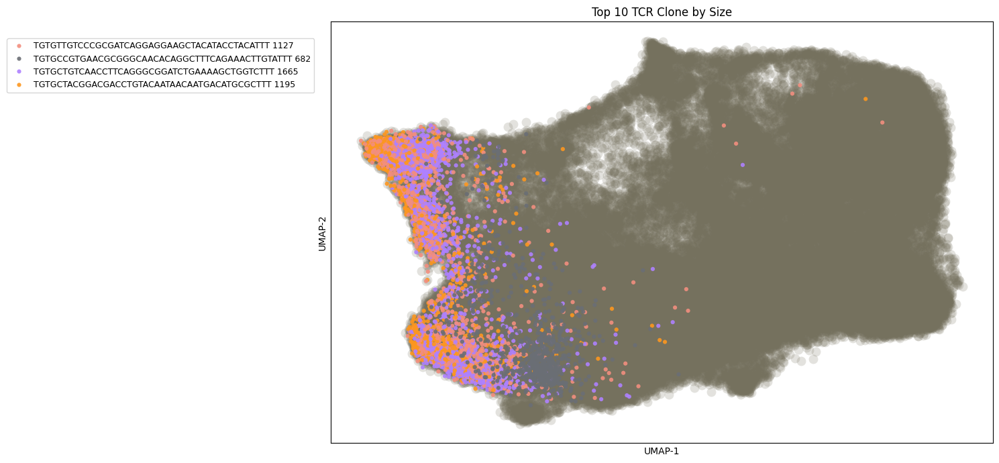

In [30]:
tcri.pl.top_clone_umap(adata, top_n=5, fg_size=20, figsize=(15,7),bg_size=100, bg_alpha=0.2, save="/Users/ceglian/Data/tcri/zhang_clones.pdf")

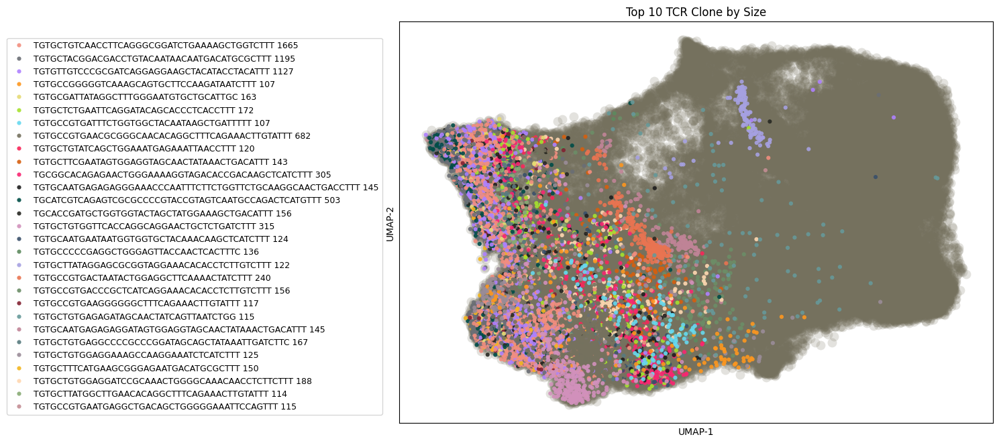

In [15]:
tcri.pl.top_clone_umap(adata, top_n=30, fg_size=20, figsize=(15,7),bg_size=100, bg_alpha=0.2, save="/Users/ceglian/Data/tcri/zhang_clones.pdf")

<Axes: xlabel='UMAP-1', ylabel='UMAP-2'>

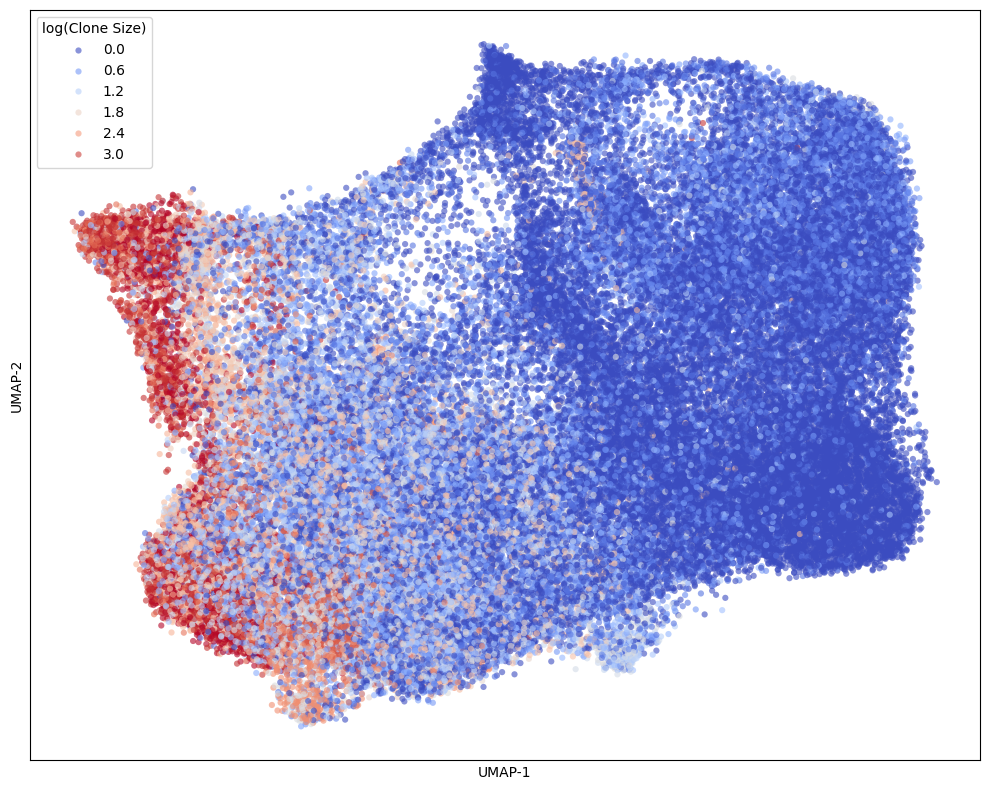

In [31]:
tcri.pl.clone_size_umap(adata,size=20,alpha=0.6,save="/Users/ceglian/Data/tcri/zhang_clone_size.pdf")

In [32]:
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)

In [33]:
markers = dict()
markers["Naive"] = ["IL7R"]
markers["Memory"] = ["GZMK"]
markers["Activated"] = ["GZMB"]
markers["Dysfunctional"] = ["CXCL13"]
adata, dist = cembed.phenotype_probability(adata, markers, method="normalized_exponential",temperature=0.008, return_distances=True)

Using Normalized Exponential (Temp: 0.008)
Computing similarities for Naive
Markers: IL7R


100%|██████████| 77030/77030 [00:01<00:00, 75623.62it/s]


Computing similarities for Memory
Markers: GZMK


100%|██████████| 77030/77030 [00:01<00:00, 72345.61it/s]


Computing similarities for Activated
Markers: GZMB


100%|██████████| 77030/77030 [00:01<00:00, 74352.00it/s]


Computing similarities for Dysfunctional
Markers: CXCL13


100%|██████████| 77030/77030 [00:01<00:00, 75212.62it/s]


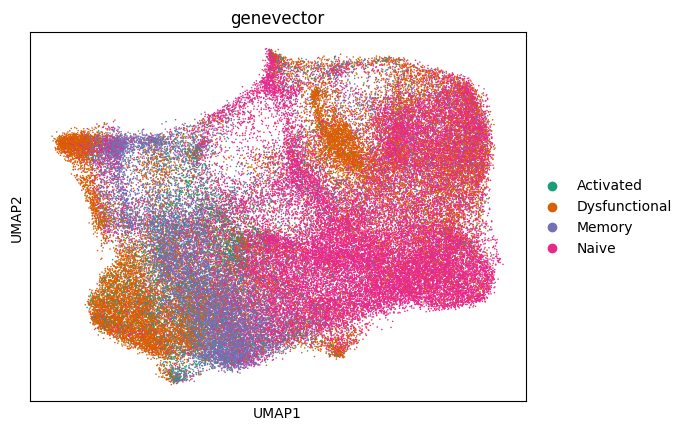

'/Users/ceglian/Data/tcri/zhang/figures/zhang.pdf'

In [34]:
sc.pl.umap(adata,color="genevector",s=5,save="zhang.pdf")
shutil.copyfile("figures/umapzhang.pdf",os.path.join(figure_path,"zhang.pdf"))

<Axes: xlabel='genevector', ylabel='count'>

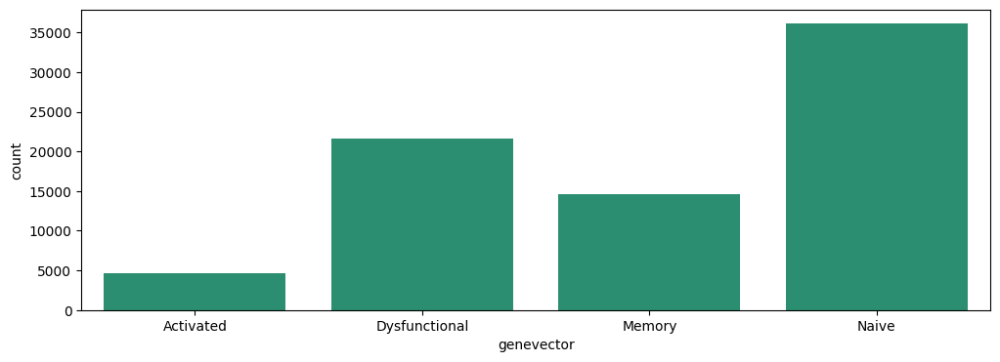

In [35]:
import seaborn as sns
fig,ax=plt.subplots(1,1,figsize=(12,4))
sns.countplot(data=adata.obs, x="genevector",ax=ax)

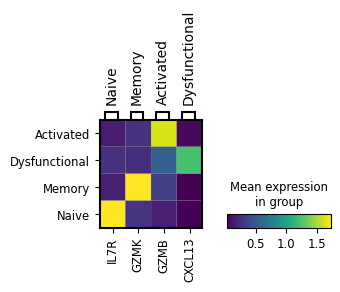

'/Users/ceglian/Data/tcri/zhang/figures/matrixplot_markers.pdf'

In [36]:
sc.pl.matrixplot(adata,markers,groupby="genevector", save="markers.pdf")
shutil.copyfile("figures/matrixplot_markers.pdf",os.path.join(figure_path, "matrixplot_markers.pdf"))

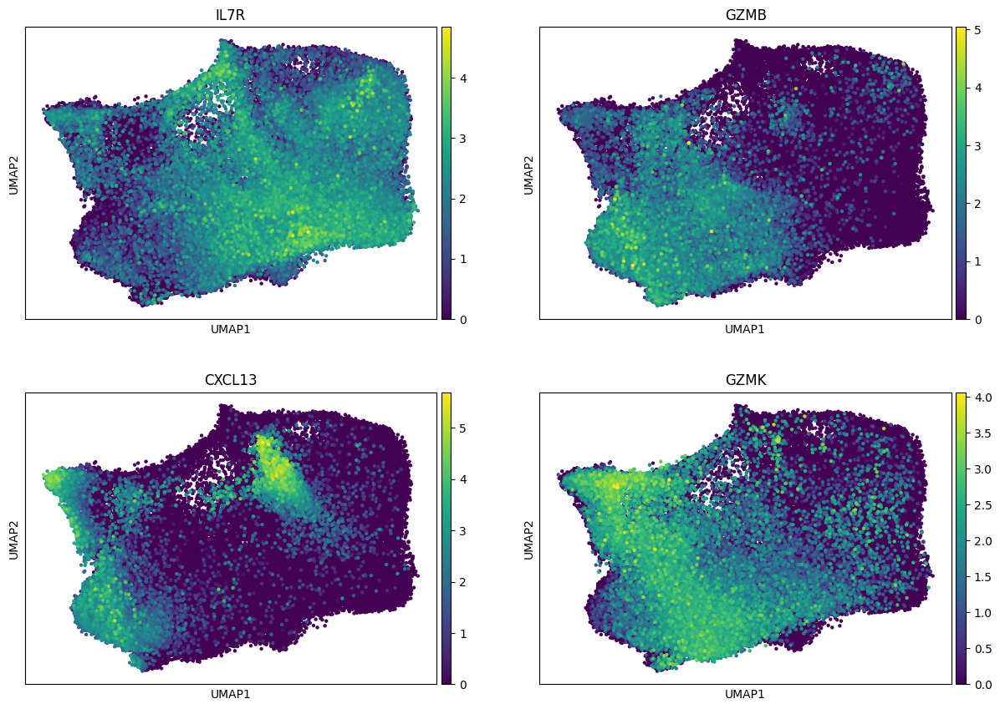

'/Users/ceglian/Data/tcri/zhang/figures/umapzhang_markers.pdf'

In [22]:
sc.pl.umap(adata,color=["IL7R","GZMB","CXCL13","GZMK"],ncols=2,s=40, save="zhang_markers.pdf")
shutil.copyfile("figures/umapzhang_markers.pdf",os.path.join(figure_path, "umapzhang_markers.pdf"))

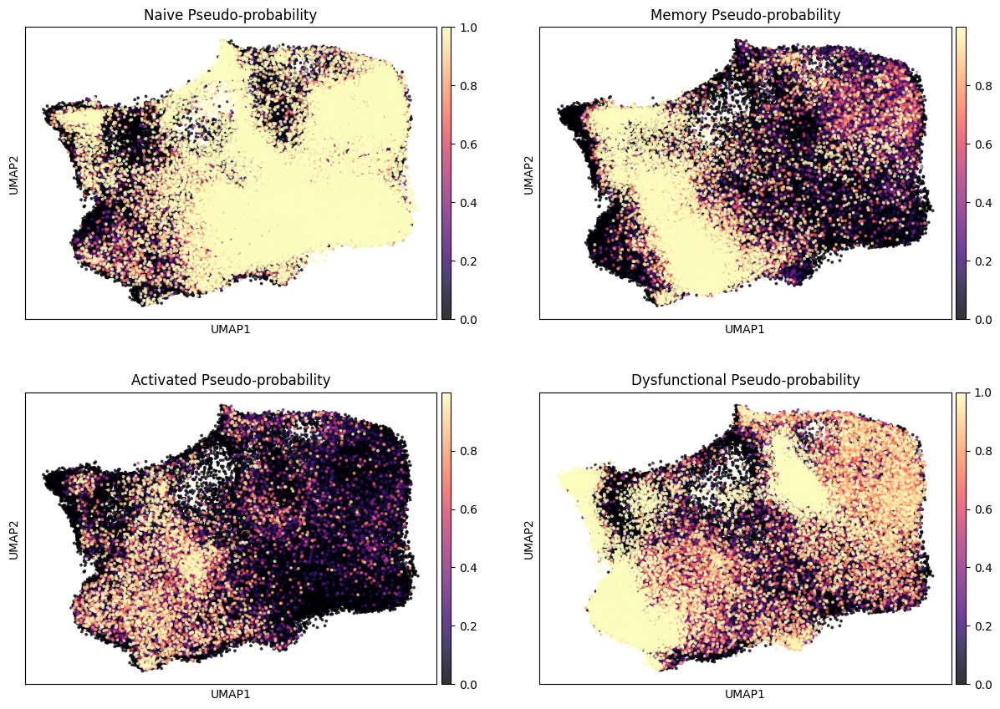

'/Users/ceglian/Data/tcri/zhang/figures/umapprobs.pdf'

In [37]:
cembed.plot_probabilities(adata)
shutil.copyfile("figures/umapprobs.pdf",os.path.join(figure_path,"umapprobs.pdf"))

In [38]:
tcri.pp.clone_size(adata)
adata.obs["clone_size"]

cellid
P1.ut.AAACCTGGTGGTACAG-1        1
P1.ut.AAACCTGTCACGGTTA-1        5
P1.ut.AAACCTGTCCGCTGTT-1       43
P1.ut.AAACGGGAGTCCCACG-1        4
P1.ut.AAACGGGAGTTAGCGG-1        3
                               ..
P38.tr.1.TTTGCGCAGCTAGTTC-1     1
P38.tr.1.TTTGCGCGTTGCCTCT-1     1
P38.tr.1.TTTGCGCTCATCGATG-1    30
P38.tr.1.TTTGGTTCACGGTAAG-1     4
P38.tr.1.TTTGTCAGTCACTTCC-1     3
Name: clone_size, Length: 77030, dtype: int64

In [40]:
i = 0
main_color_map = dict()
adata = adata.copy()
colors = tcri.pl.tcri_colors.copy() + tcri.pl.tcri_colors.copy() + tcri.pl.tcri_colors.copy()
for x in ["genevector", "complete_response","response","treatment","timepoint_relapse", "timepoint","patient",]:
    ct = []
    print(x)
    for i, val in enumerate(set(adata.obs[x].tolist())):
        c = colors.pop(i)
        ct.append(c)
        main_color_map[val] = c
    adata.uns["{}_colors".format(x)] = ct
adata.uns

genevector
complete_response
response
treatment
timepoint_relapse
timepoint
patient


OrderedDict([('tcri_clone_key', 'trb'),
             ('tcri_unique_clonotypes',
              array(['TGCACATTTAACTACTTTGGAAATGAGAAATTAACCTTT',
                     'TGCACCACACCCCCAGGAACCTACAAATACATCTTT',
                     'TGCACCCACGGGTTTTATGGAGGAAGCCAAGGAAATCTCATCTTT', ...,
                     'TGTTTGGGGTATGCACTCAACTTC',
                     'TGTTTGTCGTATAGGTCGATCGGAGGTAGCAACTATAAACTGACATTT',
                     'TGTTTTACCTCAGGAACCTACAAATACATCTTT'], dtype='<U78')),
             ('neighbors',
              {'connectivities_key': 'connectivities',
               'distances_key': 'distances',
               'params': {'n_neighbors': 50,
                'method': 'umap',
                'random_state': 0,
                'metric': 'euclidean',
                'use_rep': 'X_genevector'}}),
             ('umap',
              {'params': {'a': 0.9921756193617666, 'b': 1.112253384236506}}),
             ('log1p', {'base': None}),
             ('probability_columns',
              ['Naiv

In [41]:
tcri.pp.register_phenotype_key(adata,"genevector")

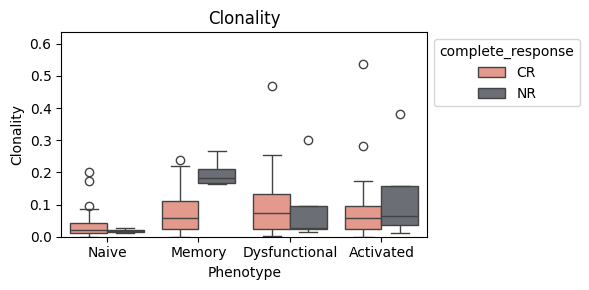

In [44]:
tcri.pl.clonality(adata,groupby="patient",figsize=(6,3),splitby="complete_response",order=["Naive","Memory","Dysfunctional","Activated"])
plt.savefig("/Users/ceglian/Data/tcri/zhang_clonality.pdf")

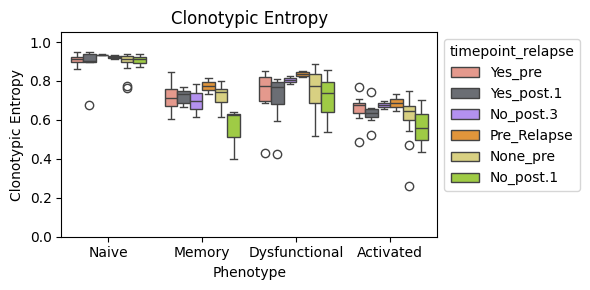

In [45]:
tcri.pl.clonotypic_entropy(adata,groupby="patient",figsize=(6,3),method="probabilistic",splitby="timepoint_relapse",normalized=True,order=["Naive","Memory","Dysfunctional","Activated"])
plt.savefig("/Users/ceglian/Data/tcri/zhang_clonotypic_entropy.pdf")

{'Dysfunctional': 0.0, 'Memory': 1.1102230246251565e-16, 'Naive': 0.10148285328240392}


,Phenotype,Patient,Size,Timepoint,Clonotypic Entropy,Clonality,Dysfunction,Number Phenotypes
0,Memory,P37,3.273810,post.1,0.496605,2.013337e-01,0.142272,4
1,Memory,P3,1.425258,pre,0.759924,2.213219e-02,0.197153,4
2,Memory,P23,7.362003,pre,0.621396,6.821307e-02,0.049000,4
3,Memory,P24,18.151955,pre,0.753625,5.039575e-02,0.139116,4
4,Memory,P36,9.111842,post.1,0.638179,1.618918e-01,0.020656,4
...,...,...,...,...,...,...,...,...
178,Activated,P20,3.963636,pre,0.550966,8.876940e-03,0.012226,4
179,Activated,P7,4.107023,pre,0.733152,3.982352e-02,0.219128,4
180,Activated,P6,6.138961,pre,0.597603,6.366855e-02,0.074909,4
181,Activated,P27,1.625668,pre,0.547257,-2.220446e-16,0.017926,4


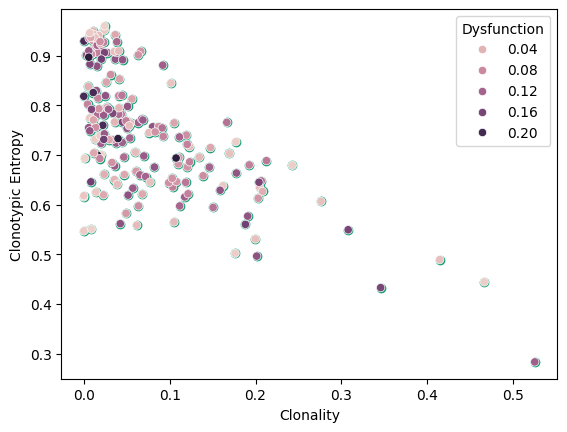

In [33]:
x = []
y = []

phs = []
tps = []
pt = []

sz = []
dys = []
nphenos = []

import numpy as np

for ph in set(adata.obs['genevector']):
    for p in set(adata.obs["patient"]):
        sub = adata[adata.obs["patient"] == p]
        for tp in set(sub.obs["timepoint"]):
            subx = sub[sub.obs["timepoint"] == tp]
            cent = tcri.tl.clonotypic_entropy(subx,ph,normalized=True)
            clonality = tcri.tl.clonality(subx)
            if ph not in clonality:
                print(clonality)
                continue
            clonality = clonality[ph]
            dys.append(np.mean(subx.obs['Activated Pseudo-probability']))
            sz.append(np.mean(subx.obs['clone_size']))
            nphenos.append(len(set(subx.obs["genevector"])))
            phs.append(ph)
            pt.append(p)
            tps.append(tp)
            x.append(cent)                            
            y.append(clonality)
plt.scatter(y,x)
plt.ylabel("Clonotypic Entropy")
plt.xlabel("Clonality")

import seaborn as sns

df = pd.DataFrame.from_dict({"Phenotype":phs,"Patient":pt,"Size":sz, "Timepoint":tps, "Clonotypic Entropy": x, "Clonality": y, "Dysfunction": dys, "Number Phenotypes": nphenos})
# df["Size"] = np.log2(df["Size"])
sns.scatterplot(data=df, x= "Clonality",y="Clonotypic Entropy", hue="Dysfunction")
df

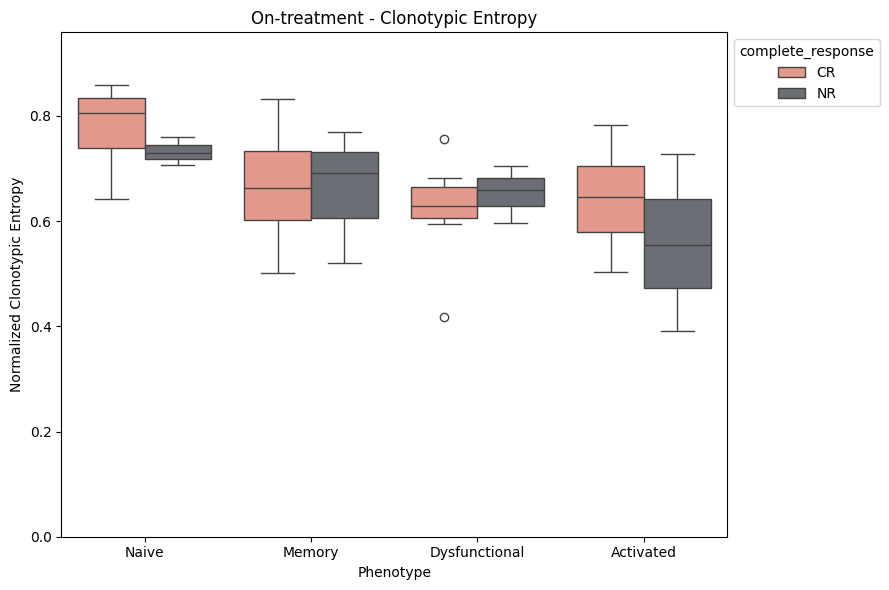

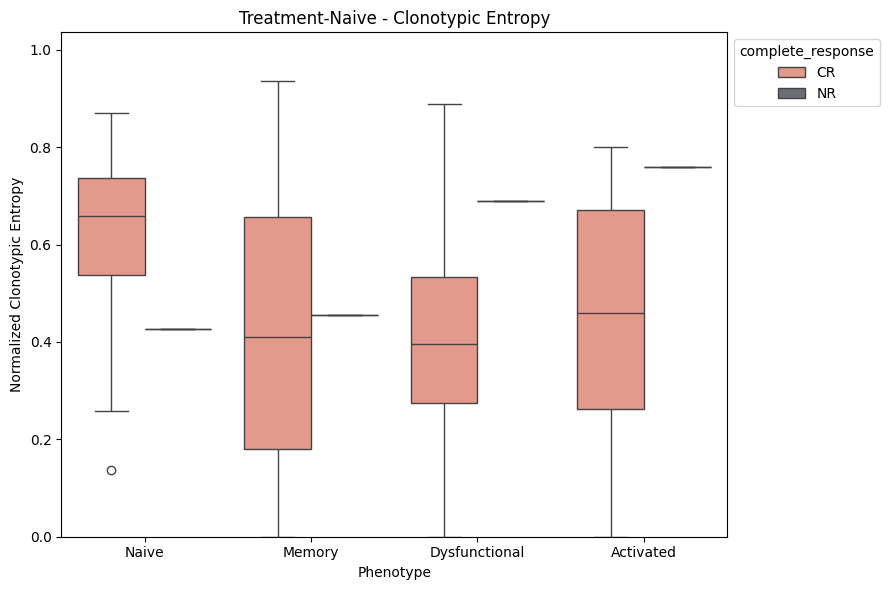

In [81]:
for response in set(adata.obs["treatment"]):
    sub = adata[adata.obs["treatment"] == response]
    sub = sub[sub.obs["clone_size"] > 20]
    tcri.pl.clonotypic_entropy(sub,groupby="patient",figsize=(9,6),method="probabilistic",splitby="complete_response",normalized=True,order=["Naive","Memory","Dysfunctional","Activated"])
    plt.title(response + " - Clonotypic Entropy")
    plt.ylabel("Normalized Clonotypic Entropy")
    plt.savefig("/Users/ceglian/Data/tcri/zhang_cent{}.pdf".format(response))
    # plt.savefig("/Users/ceglian/Data/tcri/zhang/figures/clonotypic_entropy.pdf")

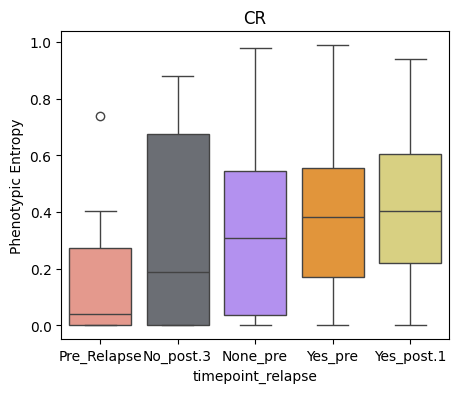

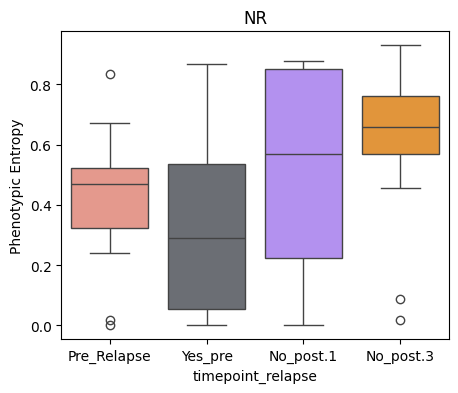

In [82]:
for x in set(adata.obs['complete_response']):
    sub = adata[adata.obs["complete_response"] == x]
    sub = sub[sub.obs["clone_size"] > 20]
    tcri.pl.phenotypic_entropy(sub,groupby="patient",splitby="timepoint_relapse")
    plt.title(x)

In [86]:
# for x,y in set(adata.obs['treatment']):
#     adata.obs["patient"]):
#     print(x,y)

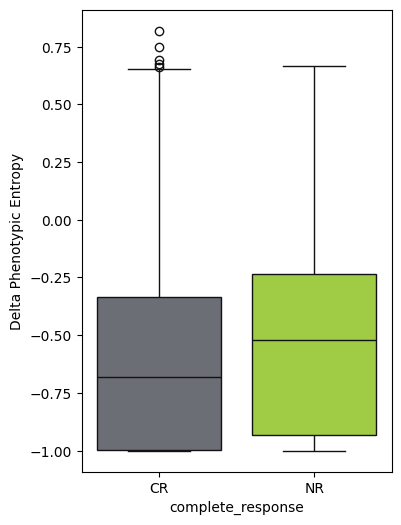

In [85]:
tcri.pl.phenotypic_entropy_delta(adata,
                                 groupby="complete_response",
                                 key='treatment',
                                 from_this="Treatment-Naive", 
                                 to_that="On-treatment", 
                                 figsize=(4,6),
                                 palette=main_color_map,
                                 save="/Users/ceglian/Data/tcri/zhang_phenotypic_entropy_deltapdf")

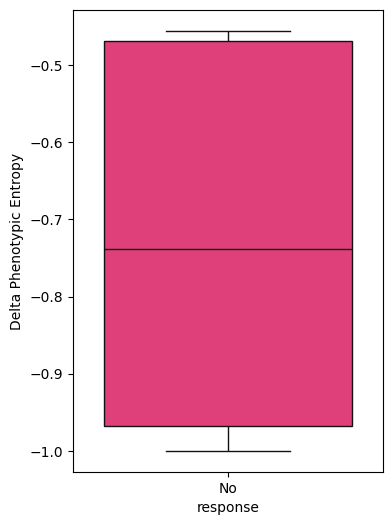

In [51]:
tcri.pl.phenotypic_entropy_delta(adata,
                                 groupby="response",
                                 key='timepoint',
                                 from_this="post.1", 
                                 to_that="post.3", 
                                 figsize=(4,6),
                                 palette=main_color_map,
                                 save="/Users/ceglian/Data/tcri/zhang_phenotypic_entropy_deltapdf")

In [ ]:
tcri.pl.phenotypic_entropy_delta(adata,
                                 groupby="response",
                                 key='timepoint',
                                 from_this="post.1", 
                                 to_that="post.3", 
                                 figsize=(4,6),
                                 palette=main_color_map,
                                 save="/Users/ceglian/Data/tcri/zhang_phenotypic_entropy_deltapdf")

In [68]:
for patient in set(adata.obs["patient"]):
    pdata = adata[adata.obs["patient"]==patient]
    tps = len(set(pdata.obs["timepoint_complex"]))
    if tps > 1:
        print(patient, set(pdata.obs["timepoint_relapse"]))

P1 {'Pre_Relapse', 'Yes_post.1', 'Yes_pre', 'No_post.3'}
P29 {'Yes_post.1', 'Yes_pre'}
P33 {'Yes_post.1', 'Yes_pre'}
P19 {'Yes_post.1', 'Yes_pre'}
P13 {'Pre_Relapse', 'Yes_pre', 'No_post.3'}
P10 {'Yes_post.1', 'Yes_pre'}
P35 {'Yes_post.1', 'Yes_pre'}
P30 {'Yes_post.1', 'Yes_pre'}


In [46]:
import collections
rdict = collections.defaultdict(list)
for x,y in zip(adata.obs["complete_response"],adata.obs["patient"]):
    rdict[y] = x

In [50]:
main_color_map

{'Dysfunctional': '#F28E7F',
 'Memory': '#AE81FF',
 'Naive': '#E6DB74',
 'Activated': '#66D9EF',
 'CR': '#6A6E75',
 'NR': '#A6E22E',
 'No': '#FD971F',
 'Yes': '#F92659',
 'None': '#F92672',
 'On-treatment': '#75715E',
 'Treatment-Naive': '#1E1E1E',
 'Yes_post.1': '#D65F0E',
 'No_post.3': '#272822',
 'Yes_pre': '#3A506B',
 'Pre_Relapse': '#A6A1E2',
 'None_pre': '#6C8D67',
 'No_post.1': '#669999',
 'post.3': '#004d47',
 'post.2': '#5D8A5E',
 'post.1': '#832232',
 'pre': '#587B7F',
 'P9': '#D291BC',
 'P11': '#C08497',
 'P29': '#F3B61F',
 'P8': '#88AB75',
 'P24': '#6D6A75',
 'P4': '#6A6E75',
 'P16': '#FD971F',
 'P37': '#A6E22E',
 'P17': '#75715E',
 'P18': '#D65F0E',
 'P15': '#1E1E1E',
 'P13': '#272822',
 'P10': '#3A506B',
 'P20': '#A6A1E2',
 'P36': '#6C8D67',
 'P6': '#669999',
 'P22': '#587B7F',
 'P26': '#F3B61F',
 'P35': '#88AB75',
 'P3': '#6D6A75',
 'P21': '#6A6E75',
 'P1': '#FD971F',
 'P7': '#A6E22E',
 'P2': '#75715E',
 'P27': '#D65F0E',
 'P38': '#1E1E1E',
 'P5': '#272822',
 'P23': '#3A

['pre', 'post.1']


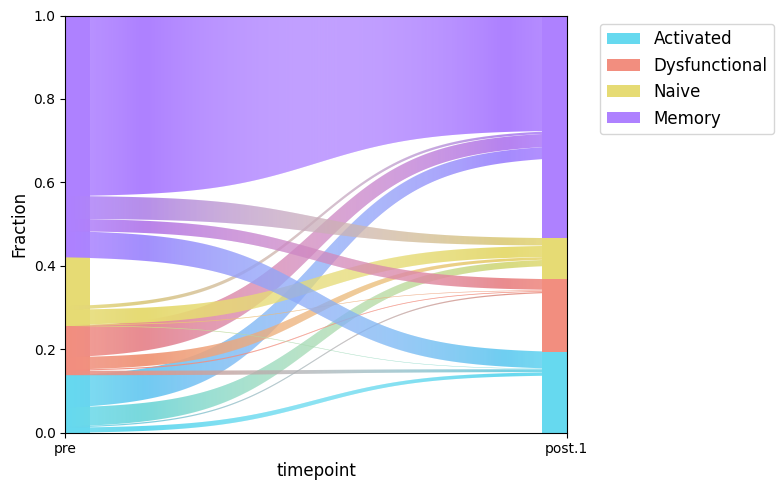

In [49]:
sub = adata[adata.obs["patient"] == "P13"]
sub = sub[sub.obs["clone_size"] > 10]
tcri.pp.joint_distribution(sub)
print(vtps)
tcri.pl.phenotypic_flux(sub,splitby="timepoint",order=['pre', 'post.1'],nt=False,normalize=True,phenotype_colors=main_color_map, figsize=(8,5))

P29 ['pre', 'post.1']
P13 ['pre', 'post.1', 'post.3']
P10 ['pre', 'post.1']
P35 ['pre', 'post.1']
P1 ['pre', 'post.1', 'post.2', 'post.3']
P33 ['pre', 'post.1']
P19 ['pre', 'post.1']
P30 ['pre', 'post.1']


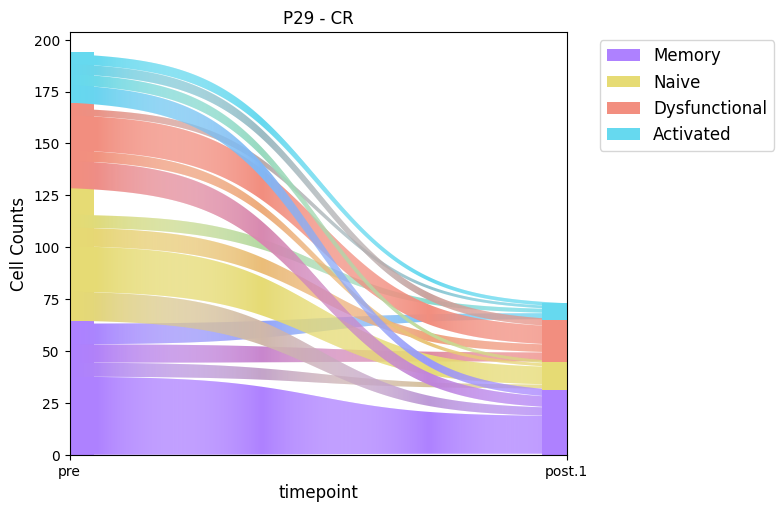

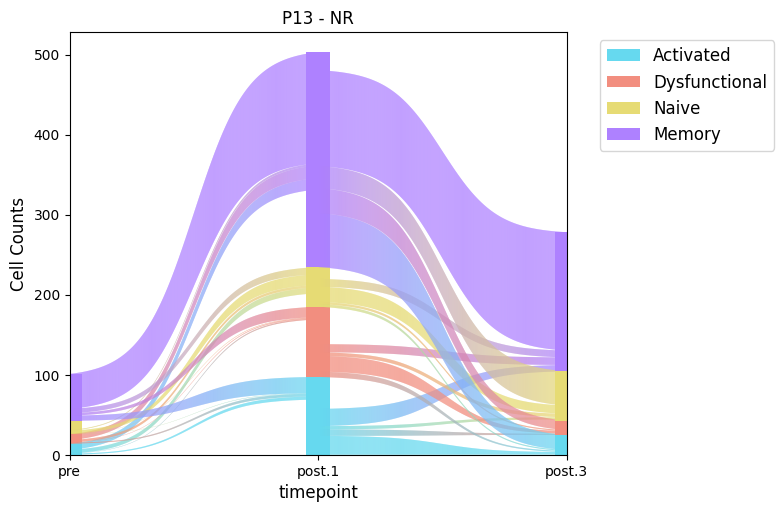

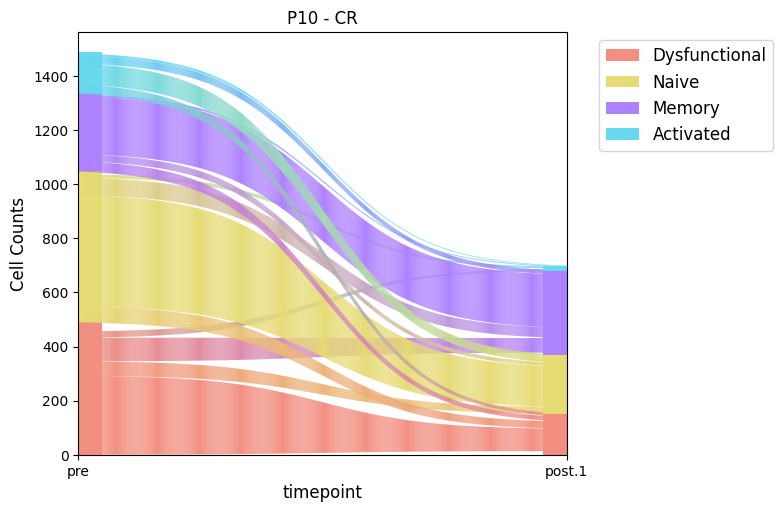

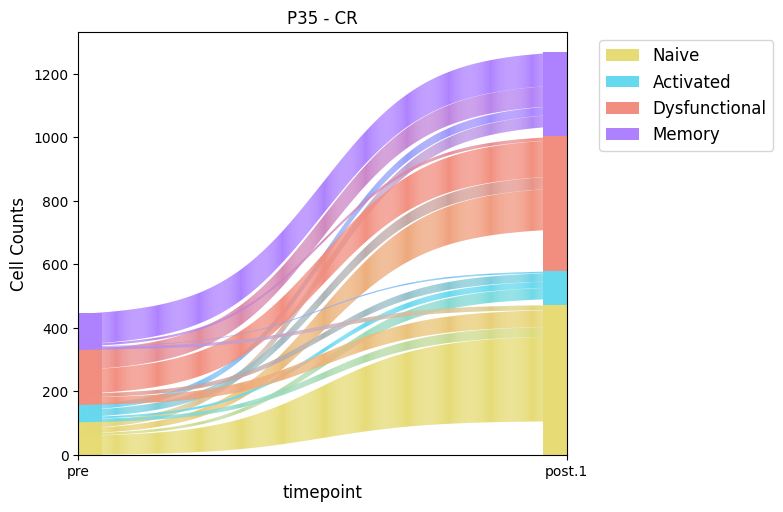

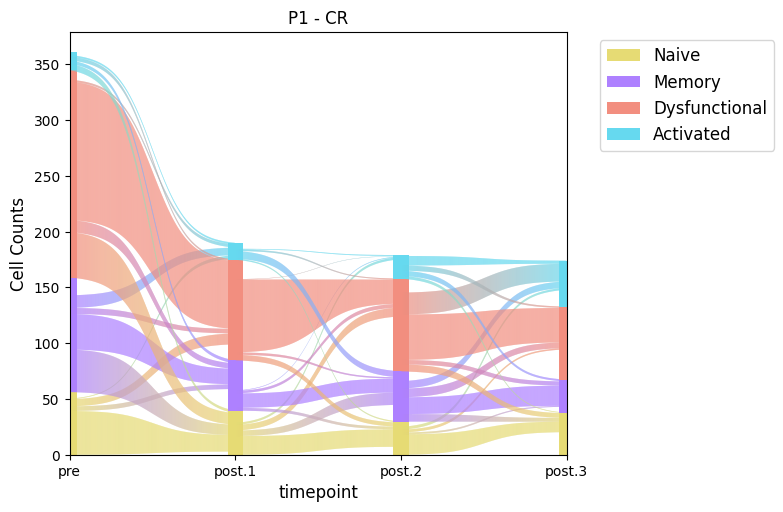

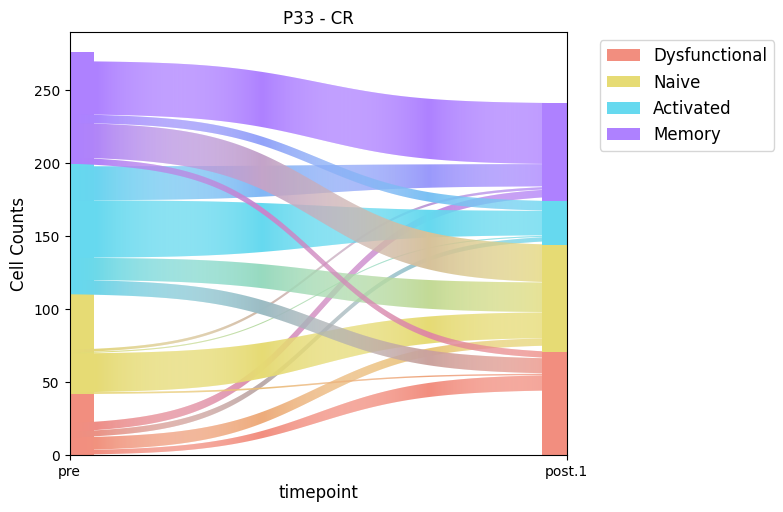

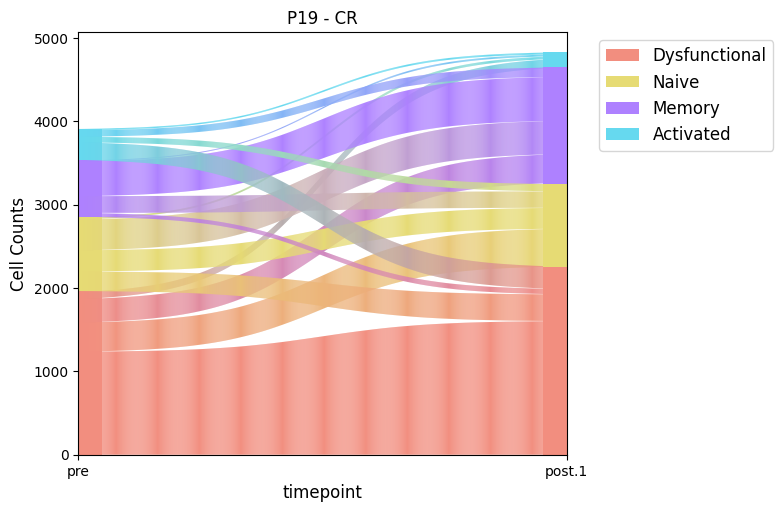

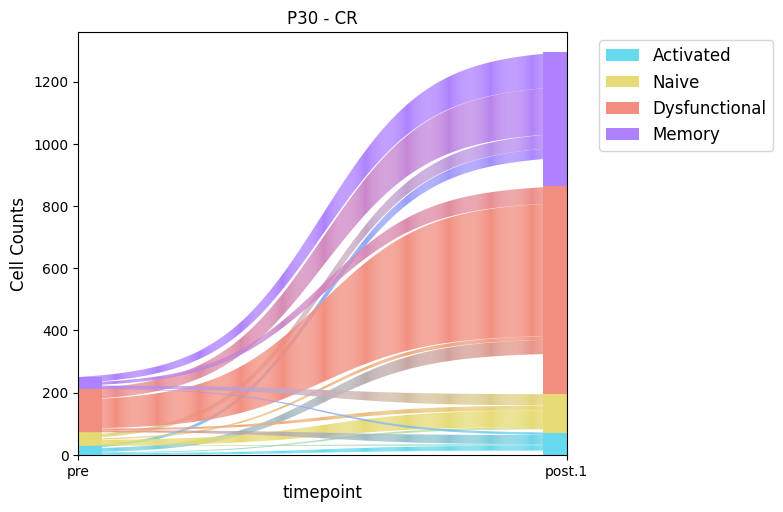

In [47]:
for p in set(adata.obs["patient"]):
    sub = adata[adata.obs["patient"] == p]
    if len(set(sub.obs["timepoint"])) < 2:
        continue
    tps = set(sub.obs["timepoint"])
    vtps = []
    for x in ["pre","post.1","post.2","post.3"]:
        if x in tps:
            vtps.append(x)
    print(p, vtps)
    sub = sub[sub.obs["clone_size"] > 10]
    tcri.pp.joint_distribution(sub)
    tcri.pl.phenotypic_flux(sub,splitby="timepoint",order=vtps,nt=False,normalize=False,phenotype_colors=main_color_map, figsize=(8,5))
    plt.title(p + " - " + rdict[p])
    break

{'None', 'Yes'}


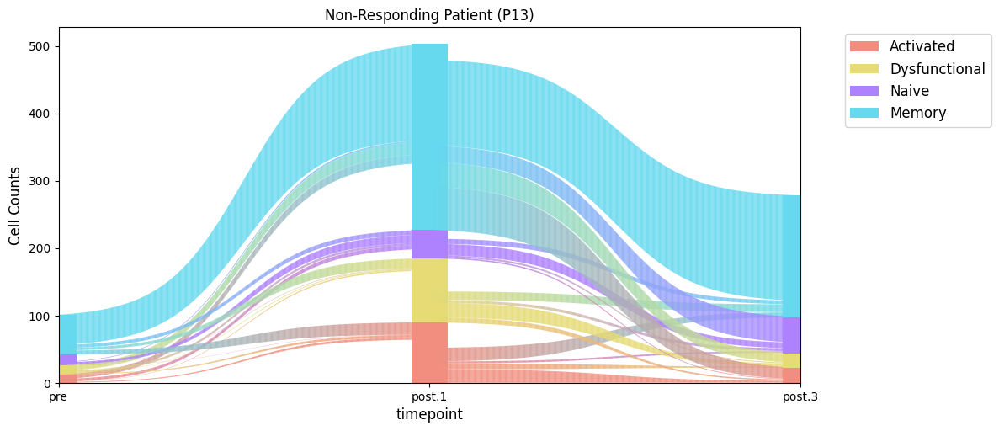

In [226]:
sub = adata[adata.obs["patient"] == "P13"]
# sub = adata[adata.obs["complete_response"] == "NR"]
sub = sub[sub.obs["clone_size"]>10]
print(set(sub.obs["response"]))
tcri.pp.joint_distribution(sub)
tcri.pl.phenotypic_flux(sub,splitby="timepoint",order=["pre","post.1","post.3"],nt=False,normalize=False,phenotype_colors=main_color_map,figsize=(12,5))
plt.title("Non-Responding Patient (P13)")
plt.savefig("/Users/ceglian/Data/tcri/zhang_p13_sankey.pdf")


{'No', 'Yes'}


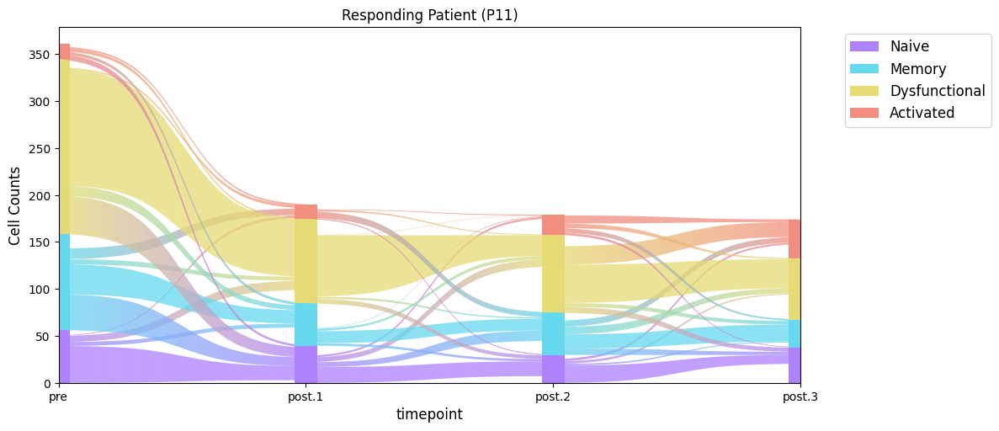

In [229]:
sub = adata[adata.obs["patient"] == "P1"]
sub = sub[sub.obs["clone_size"]>10]
print(set(sub.obs["response"]))
tcri.pp.joint_distribution(sub)
tcri.pl.phenotypic_flux(sub,splitby="timepoint",order=["pre","post.1","post.2","post.3"],nt=False,normalize=False,phenotype_colors=main_color_map,figsize=(12,5))
plt.title("Responding Patient (P11)")
plt.savefig("/Users/ceglian/Data/tcri/zhang_p1_sankey.pdf")


  0%|          | 0/2 [00:00<?, ?it/s]

100%|██████████| 2/2 [00:00<00:00,  2.91it/s]

['#6A6E75', '#F28E7F']


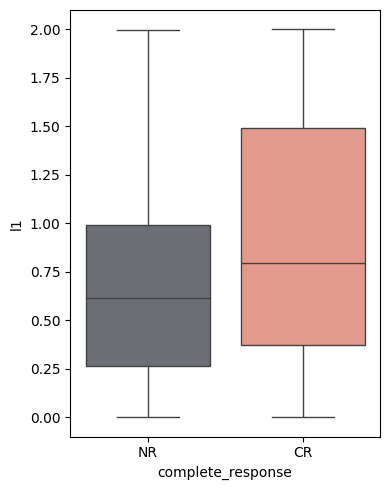

In [233]:
sub = adata[adata.obs["clone_size"] > 3]
tcri.pl.flux(sub, key="treatment", order=["Treatment-Naive","On-treatment"], groupby="complete_response", method="probabilistic", distance_metric="l1",paint="complete_response",figsize=(4,5), palette=main_color_map)
# plt.savefig("/Users/ceglian/Data/tcri/dkl_response_zhang.pdf")

  0%|          | 0/29 [00:00<?, ?it/s]

100%|██████████| 29/29 [00:00<00:00, 79.00it/s]


['#F28E7F', '#6A6E75', '#F28E7F', '#6A6E75', '#F28E7F', '#F28E7F', '#F28E7F', '#F28E7F', '#F28E7F', '#6A6E75', '#F28E7F', '#F28E7F', '#F28E7F', '#F28E7F', '#F28E7F', '#F28E7F', '#F28E7F', '#F28E7F', '#F28E7F', '#F28E7F', '#6A6E75', '#F28E7F', '#F28E7F', '#F28E7F', '#F28E7F', '#F28E7F', '#F28E7F', '#F28E7F', '#F28E7F']


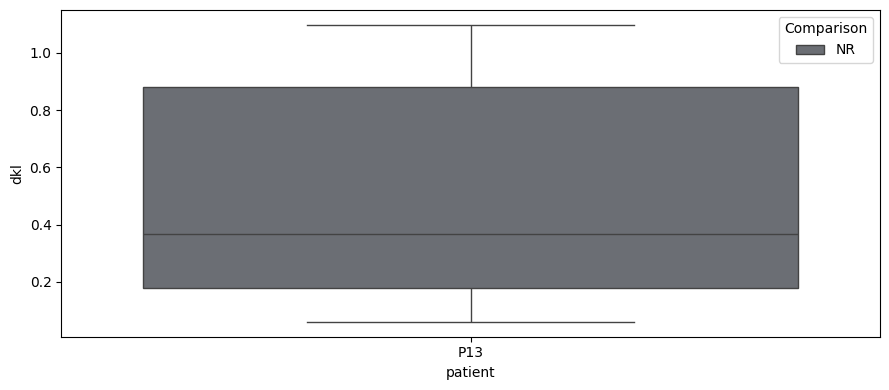

In [160]:
sdata = adata[adata.obs["clone_size"] > 1]
tcri.pl.flux(sub, key="treatment", order=["Treatment-Naive","On-treatment"], groupby="patient", method="probabilistic", distance_metric="dkl",paint="complete_response",figsize=(9,4), palette=main_color_map)
plt.savefig("/Users/ceglian/Data/tcri/l1_response_disease_flux_patient_zhang.pdf")

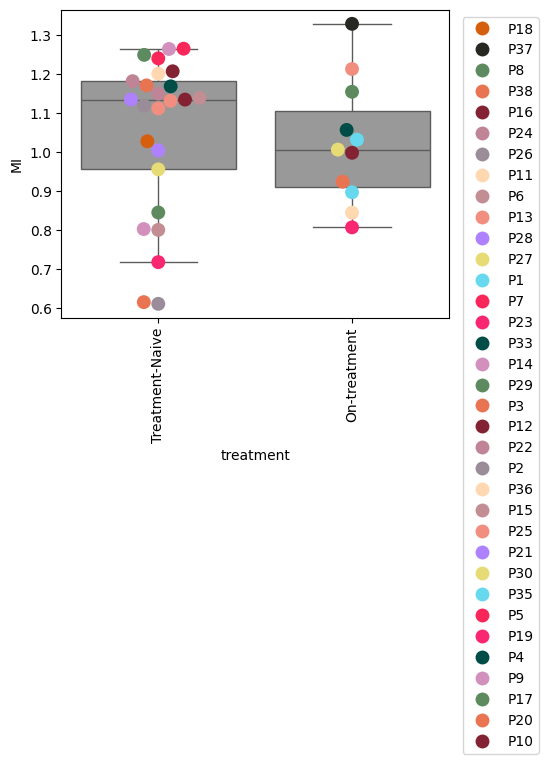

In [237]:
tcri.pl.mutual_information(adata, groupby="patient",splitby="treatment",figsize=(5,4), size=10, bbox_to_anchor=(1.25,1.0),colors=main_color_map,order=["Treatment-Naive","On-treatment"])
plt.savefig("/Users/ceglian/Data/tcri/zhang_mutual_info.pdf")

P18
P37
P8
P38
P16
P24
P26
P11
P6
P13
P28
P27
P1
P7
P23
P33
P14
P29
P3
P12
P22
P2
P36
P15
P25
P21
P30
P35
P5
P19
P4
P9
P17
P20
P10
117


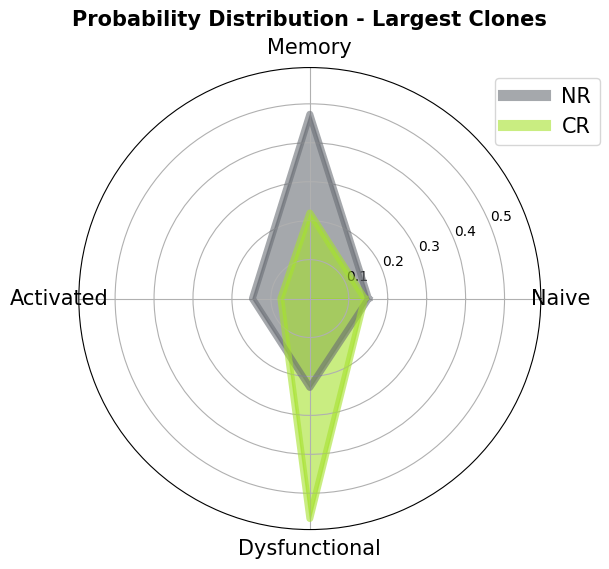

In [241]:
from tcri.pp import joint_distribution
from tcri.tl import probability_distribution as pdistribution
def get_largest_clonotypes(adata, n=20):
    df = adata.obs[[adata.uns["tcri_clone_key"],"clone_size"]]
    return df.sort_values("clone_size",ascending=False)[adata.uns['tcri_clone_key']].unique().tolist()[:n]
largest_10 = []
for x in set(adata.obs["patient"]):
    sub = adata[adata.obs["patient"] == x]
    largest_10 += get_largest_clonotypes(sub,n=5)
    print(x)
print(len(set(largest_10)))
subx = adata[adata.obs[adata.uns["tcri_clone_key"]].isin(largest_10)]

def polar_plot(adata, phenotypes=None, statistic="entropy", method="probabilistic", save=None, figsize=(6,6), title=None, alpha=0.6, fontsize=15, splitby=None, bbox_to_anchor=(1.15,1.), linewidth=5., legend_fontsize=15, color_dict=None):
    joint_distribution(adata,method=method )
    plt.figure(figsize=figsize)
    ax = plt.subplot(111, projection='polar')
    if splitby is None:
        splits = ['All']
    else:
        splits = list(set(adata.obs[splitby]))
    if phenotypes is None:
        phenotypes = adata.uns["joint_distribution"].index
    N = len(phenotypes)
    theta = np.linspace(0.0, 2 * np.pi, N, endpoint=False)
    plot_theta = np.append(theta, theta[0])
    subset = adata[adata.obs[adata.uns["tcri_phenotype_key"]].isin(phenotypes)]
    for i, split in enumerate(splits): 
        if color_dict == None:
            colorx = tcri_colors[i]
        else:
            colorx = color_dict[split]
        psubset = adata[adata.obs[splitby] == split]
        if statistic == "entropy":
            pdist = pd.Series(tcri.tl.clonotypic_entropies(psubset))
        else:    
            pdist = pdistribution(psubset, method=method)
        pdist = pdist.tolist()
        pdist.append(pdist[0])
        ax.plot(plot_theta, pdist, color=colorx, alpha=alpha, label=split, linewidth=linewidth)
        ax.fill_between(plot_theta, 0, pdist, color=colorx, alpha=alpha)
    ax.set_xticks(theta)
    ax.set_xticklabels(phenotypes, fontsize=fontsize)
    ax.grid(True)
    leg = ax.legend(loc='upper right', bbox_to_anchor=bbox_to_anchor, fontsize=legend_fontsize)
    for line in leg.get_lines():
        line.set_linewidth(8.0)  # Set the line width
    if title:
        plt.title(title, va='bottom', fontsize=fontsize, fontweight="bold")
    if save:
        plt.savefig(save)

# sub = adata[adata.obs["clone_size"] > 20]
sub = subx[subx.obs["complete_response"] == "NR"]
polar_plot(subx, splitby="complete_response",statistic="probability", title="Probability Distribution - Largest Clones",save="/Users/ceglian/Data/tcri/zhang_pdist_polar.pdf",color_dict=main_color_map)

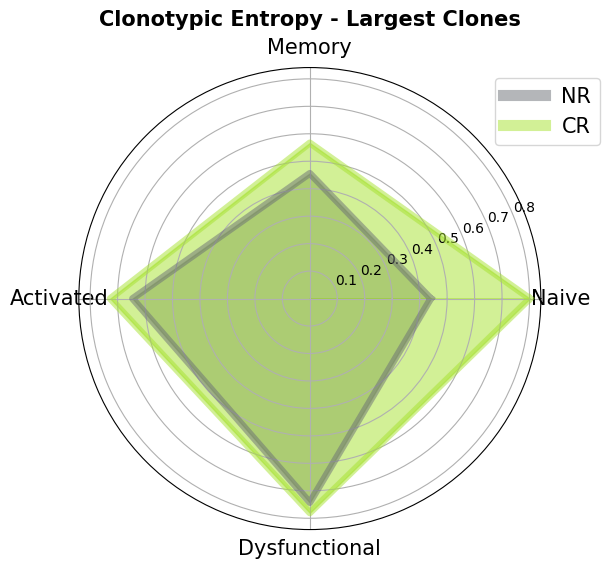

In [242]:
sub = subx[subx.obs["treatment"] == "On-treatment"]
polar_plot(subx, splitby="complete_response",statistic="entropy", title="Clonotypic Entropy - Largest Clones",save="/Users/ceglian/Data/tcri/zhang_pdist_polar.pdf",color_dict=main_color_map, alpha=0.5)

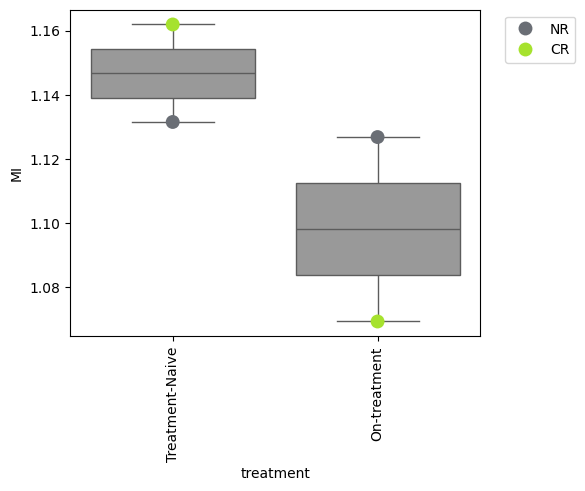

In [209]:
tcri.pl.mutual_information(adata, groupby="complete_response",splitby="treatment",figsize=(5,4), size=10, bbox_to_anchor=(1.25,1.0),colors=main_color_map,order=["Treatment-Naive","On-treatment"])
plt.savefig("/Users/ceglian/Data/tcri/zhang_mutual_info.pdf")

In [255]:
df = tcri.tl.phenotypic_entropies(adata)
ct = []
for x in adata.obs["trb"]:
    print(df[x])
    ct.append(df[x])
adata.obs["phenotypic_entropy"] = ct

0.60481
0.79668
0.76896
0.4202
0.43879
0.03462
0.36769
0.79897
0.39102
0.63842
0.00092
0.66692
0.70927
0.50847
0.65137
0.24012
0.00112
0.51798
0.07446
0.87135
0.15877
0.61707
0.03899
0.04656
0.70536
0.4096
0.56858
0.72861
0.57258
0.00126
0.94473
0.00017
0.25147
0.20292
0.0092
0.2213
0.52368
0.7861
0.01631
0.70454
0.78768
0.35317
0.5464
0.00032
0.5464
0.80072
0.57473
0.4719
0.76896
0.00748
0.00436
0.05722
0.55097
0.52212
0.25302
0.00205
0.0018
0.00142
0.86093
0.55052
3e-05
0.74446
0.00408
0.66692
0.72861
0.58552
0.13411
0.61835
0.55665
0.69078
0.01411
0.0
9e-05
0.37734
0.10765
0.5361
9e-05
0.04732
0.81798
0.06336
0.11671
0.68317
0.73875
0.49925
0.39645
0.01071
0.53597
0.14767
0.79121
0.89465
0.51798
0.57472
0.74899
0.00043
0.00558
0.49714
0.75797
0.52247
0.76896
0.4862
0.5164
0.25302
0.02399
0.19749
0.00025
0.74197
0.46906
0.06645
0.47694
0.49219
0.72022
0.0128
0.68054
0.75769
0.29382
0.43297
0.66825
0.62925
0.00056
0.72756
0.80595
0.50114
0.00093
9e-05
0.05385
0.02299
0.27659
0.83868
0

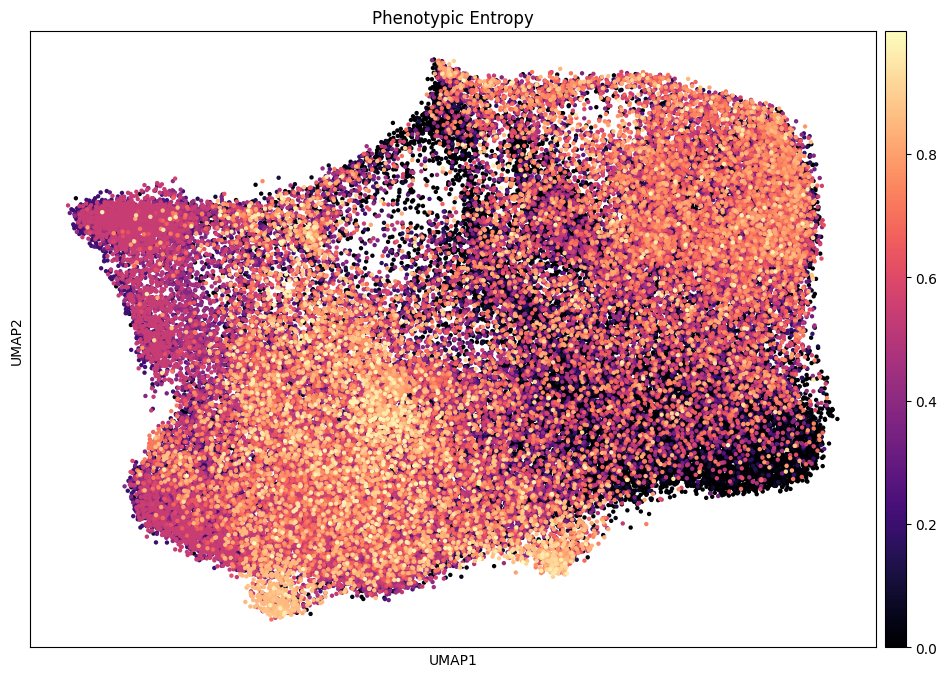

In [257]:
fig, ax = plt.subplots(1,1,figsize=(12,8))
sc.pl.umap(adata,color="phenotypic_entropy",s=40, ax=ax,cmap="magma", title="Phenotypic Entropy",save="phenotypic_entropy.pdf")
!cp  figures/umapphenotypic_entropy.pdf /Users/ceglian/Data/tcri/

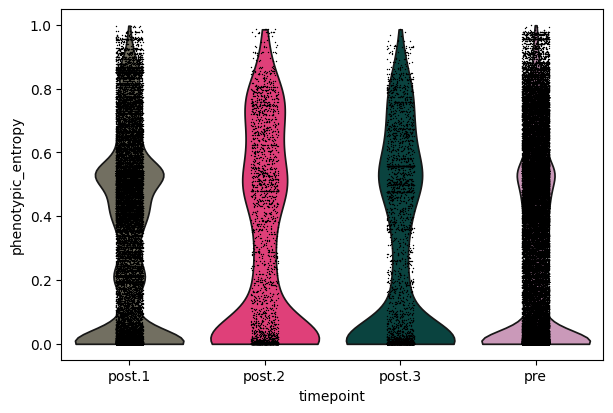

In [254]:
sc.pl.violin(adata,"phenotypic_entropy",groupby="timepoint")

In [ ]:
sc.pl.violin(adata,"phenotypic_entropy",groupby="timepoint")